<a href="https://colab.research.google.com/github/MossabLa/Handwrittung_Arabic_Text_Recognition/blob/main/Copie_de_HAWR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**1. Installation et configuration initiale**

In [ ]:
!pip install ultralytics roboflow matplotlib --quiet
!nvidia-smi  # Vérification des ressources GPU

from google.colab import drive
drive.mount('/content/drive')
from google.colab.patches import cv2_imshow
from roboflow import Roboflow
rf = Roboflow(api_key="MMw6bFepWS2hU7Dglgkh")
project = rf.workspace("hacrforyolodetection").project("hacr_for_yolo_detection")
version = project.version(3)
dataset = version.download("yolov8")



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 62.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127


Extracting Dataset Version Zip to HACR_for_YOLO_Detection-3 in yolov8:: 100%|██████████| 27117/27117 [00:02<00:00, 10707.39it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


**1.1 Faire un ensemple d'entrainement et de test 0.8, 0.2**

In [ ]:
import os
import shutil
import random
import math

# ================== User Configurable Paths ==================
# Base folder containing original YOLOv8 structure
BASE_DIR = "HACR_for_YOLO_Detection-3"
# Output base folder
OUTPUT_DIR = "HACR_for_YOLO_Detection_stratified"
# Random seed for reproducibility
SEED = 42

# Percentage split for single-class and multi-class images
TRAIN_RATIO = 0.8

# =============================================================

def gather_samples(base_dir):
    """
    Reads all images and labels from train and test subfolders,
    classifies them into single-label or multi-label lists.
    Returns:
      single_label_map: {class_id: [ (img_path, lbl_path), ... ]}
      multi_label: [ (img_path, lbl_path), ... ]
    """
    single_label_map = {}
    multi_label = []

    # Combine both train and test
    for split in ["train", "test"]:
        img_dir = os.path.join(base_dir, split, "images")
        lbl_dir = os.path.join(base_dir, split, "labels")
        for fname in os.listdir(img_dir):
            if not fname.lower().endswith(('.jpg', '.png', '.bmp')):
                continue
            img_path = os.path.join(img_dir, fname)
            label_file = os.path.splitext(fname)[0] + '.txt'
            lbl_path = os.path.join(lbl_dir, label_file)
            if not os.path.isfile(lbl_path):
                continue

            # Read classes in this label
            with open(lbl_path, 'r') as f:
                lines = [l.strip() for l in f if l.strip()]
            class_ids = [int(l.split()[0]) for l in lines]

            if len(set(class_ids)) <= 1:
                # single-label image
                cid = class_ids[0] if class_ids else None
                if cid is None:
                    continue
                single_label_map.setdefault(cid, []).append((img_path, lbl_path))
            else:
                # multi-label image
                multi_label.append((img_path, lbl_path))

    return single_label_map, multi_label


def create_output_dirs(output_dir):
    """Creates train/images, train/labels, test/images, test/labels folders."""
    for split in ['train', 'test']:
        for sub in ['images', 'labels']:
            path = os.path.join(output_dir, split, sub)
            os.makedirs(path, exist_ok=True)


def copy_samples(sample_list, dest_split, output_dir):
    """Copies image/label pairs to the specified split."""
    for img_path, lbl_path in sample_list:
        img_name = os.path.basename(img_path)
        lbl_name = os.path.basename(lbl_path)
        dst_img_dir = os.path.join(output_dir, dest_split, 'images')
        dst_lbl_dir = os.path.join(output_dir, dest_split, 'labels')
        shutil.copy(img_path, os.path.join(dst_img_dir, img_name))
        shutil.copy(lbl_path, os.path.join(dst_lbl_dir, lbl_name))


def stratified_split():
    random.seed(SEED)
    # Gather samples
    single_map, multi_list = gather_samples(BASE_DIR)

    # Prepare output dirs
    create_output_dirs(OUTPUT_DIR)

    train_samples = []
    test_samples = []

    # Split single-label by class
    for cid, samples in single_map.items():
        random.shuffle(samples)
        n_train = math.floor(len(samples) * TRAIN_RATIO)
        train_samples.extend(samples[:n_train])
        test_samples.extend(samples[n_train:])

    # Split multi-label images globally
    random.shuffle(multi_list)
    n_multi_train = math.floor(len(multi_list) * TRAIN_RATIO)
    train_samples.extend(multi_list[:n_multi_train])
    test_samples.extend(multi_list[n_multi_train:])

    # Copy files to output structure
    copy_samples(train_samples, 'train', OUTPUT_DIR)
    copy_samples(test_samples,  'test',  OUTPUT_DIR)

    print(f"Done. Train: {len(train_samples)} samples, Test: {len(test_samples)} samples.")


if __name__ == '__main__':
    stratified_split()


Done. Train: 10808 samples, Test: 2745 samples.


**2. Préparation des données et vérification**

In [ ]:
import os
import cv2
import yaml
import random
import numpy as np
from tqdm import tqdm

# Chemin vers le fichier data.yaml
DATA_YAML_PATH = "data.yaml"

with open(DATA_YAML_PATH, 'r') as f:
    data_config = yaml.safe_load(f)

print("Configuration vérifiée :")
print(f"Classes: {data_config['names']}")
print(f"Train: {data_config['train']}")
print(f"Test: {data_config['test']}")

Configuration vérifiée :
Classes: ['Alef_E', 'Alef_I', 'Ayn_B', 'Ayn_E', 'Ayn_I', 'Ayn_M', 'Baa_B', 'Baa_E', 'Baa_I', 'Baa_M', 'Dad_B', 'Dad_E', 'Dad_I', 'Dad_M', 'Dal_I', 'Dal_M', 'Faa_B', 'Faa_E', 'Faa_I', 'Faa_M', 'Ghyn_B', 'Ghyn_E', 'Ghyn_I', 'Ghyn_M', 'HA_B', 'HA_E', 'HA_I', 'HA_M', 'Haa_B', 'Haa_E', 'Haa_I', 'Haa_M', 'Jeem_B', 'Jeem_E', 'Jeem_I', 'Jeem_M', 'Kaf_B', 'Kaf_E', 'Kaf_I', 'Kaf_M', 'Kha_B', 'Kha_E', 'Kha_I', 'Kha_M', 'Lam_B', 'Lam_E', 'Lam_I', 'Lam_M', 'Noon_B', 'Noon_E', 'Noon_I', 'Noon_M', 'QAF_B', 'QAF_E', 'QAF_I', 'QAF_M', 'Raa_E', 'Raa_I', 'Saad_B', 'Saad_E', 'Saad_I', 'Saad_M', 'Seen_B', 'Seen_E', 'Seen_I', 'Seen_M', 'Sheen_B', 'Sheen_E', 'Sheen_I', 'Sheen_M', 'Taa_B', 'Taa_E', 'Taa_I', 'Taa_M', 'Thaa_B', 'Thaa_E', 'Thaa_I', 'Thaa_M', 'Ttaa_B', 'Ttaa_I', 'Ttaa_M', 'Waw_E', 'Waw_I', 'Yaa_B', 'Yaa_E', 'Yaa_I', 'Yaa_M', 'Zay_E', 'Zay_I', 'dhaa_B', 'dhaa_I', 'dhaa_M', 'dhal_I', 'dhal_M', 'meem_B', 'meem_E', 'meem_I', 'meem_M']
Train: /content/HACR_for_YOLO_Detection_s

**3. Fonctions de prétraitement avec ajustement des annotations**

In [ ]:
def adjust_annotation(annotation_path, original_size, target_size=416):
    """
    Ajuste les coordonnées YOLO après redimensionnement + padding
    """
    with open(annotation_path, 'r') as f:
        lines = f.readlines()

    orig_h, orig_w = original_size
    scale = min(target_size/orig_h, target_size/orig_w)
    pad_x = (target_size - orig_w * scale) / 2
    pad_y = (target_size - orig_h * scale) / 2

    adjusted = []
    for line in lines:
        parts = line.strip().split()
        class_id = parts[0]
        coords = list(map(float, parts[1:]))

        # Conversion coordonnées absolues
        xc_abs = coords[0] * orig_w
        yc_abs = coords[1] * orig_h
        w_abs = coords[2] * orig_w
        h_abs = coords[3] * orig_h

        # Application scaling + padding
        xc_new = (xc_abs * scale + pad_x) / target_size
        yc_new = (yc_abs * scale + pad_y) / target_size
        w_new = (w_abs * scale) / target_size
        h_new = (h_abs * scale) / target_size

        adjusted.append(f"{class_id} {xc_new:.6f} {yc_new:.6f} {w_new:.6f} {h_new:.6f}")

    return adjusted

def process_image(img_path, lbl_path, target_size=416):
    """
    Pipeline complet de traitement d'une image
    """
    # Chargement original
    img = cv2.imread(img_path)
    orig_h, orig_w = img.shape[:2]

    # Redimensionnement intelligent
    scale = min(target_size/orig_h, target_size/orig_w)
    new_h, new_w = int(orig_h * scale), int(orig_w * scale)
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

    # Ajout de padding
    delta_w = target_size - new_w
    delta_h = target_size - new_h
    pad_top, pad_bottom = delta_h//2, delta_h - (delta_h//2)
    pad_left, pad_right = delta_w//2, delta_w - (delta_w//2)

    padded = cv2.copyMakeBorder(resized, pad_top, pad_bottom, pad_left, pad_right,
                               cv2.BORDER_CONSTANT, value=[114, 114, 114])

    # Prétraitement d'image
    gray = cv2.cvtColor(padded, cv2.COLOR_BGR2GRAY)
    lab = cv2.cvtColor(padded, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    limg = clahe.apply(l)
    processed = cv2.merge((limg, a, b))
    processed = cv2.cvtColor(processed, cv2.COLOR_LAB2BGR)

    # Ajustement des annotations
    adjusted_ann = adjust_annotation(lbl_path, (orig_h, orig_w), target_size)

    return processed, adjusted_ann

**4. Préparation du dataset YOLO**

In [ ]:
def prepare_yolo_dataset(target_size=416):
    # Création des dossiers
    !mkdir -p processed_dataset/{train,test}/{images,labels}

    # Traitement des images d'entraînement
    train_images = [os.path.join(data_config['train'], f) for f in os.listdir(data_config['train'])]
    for img_path in tqdm(train_images, desc="Traitement train"):
        lbl_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
        processed_img, adjusted_ann = process_image(img_path, lbl_path, target_size)

        # Sauvegarde
        img_name = os.path.basename(img_path)
        cv2.imwrite(f'processed_dataset/train/images/{img_name}', processed_img)
        with open(f'processed_dataset/train/labels/{img_name.replace(".jpg", ".txt")}', 'w') as f:
            f.write('\n'.join(adjusted_ann))

    # Traitement des images de test
    test_images = [os.path.join(data_config['test'], f) for f in os.listdir(data_config['test'])]
    for img_path in tqdm(test_images, desc="Traitement test"):
        lbl_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
        processed_img, adjusted_ann = process_image(img_path, lbl_path, target_size)

        # Sauvegarde
        img_name = os.path.basename(img_path)
        cv2.imwrite(f'processed_dataset/test/images/{img_name}', processed_img)
        with open(f'processed_dataset/test/labels/{img_name.replace(".jpg", ".txt")}', 'w') as f:
            f.write('\n'.join(adjusted_ann))

prepare_yolo_dataset()


Traitement test: 100%|██████████| 2745/2745 [00:15<00:00, 174.05it/s]


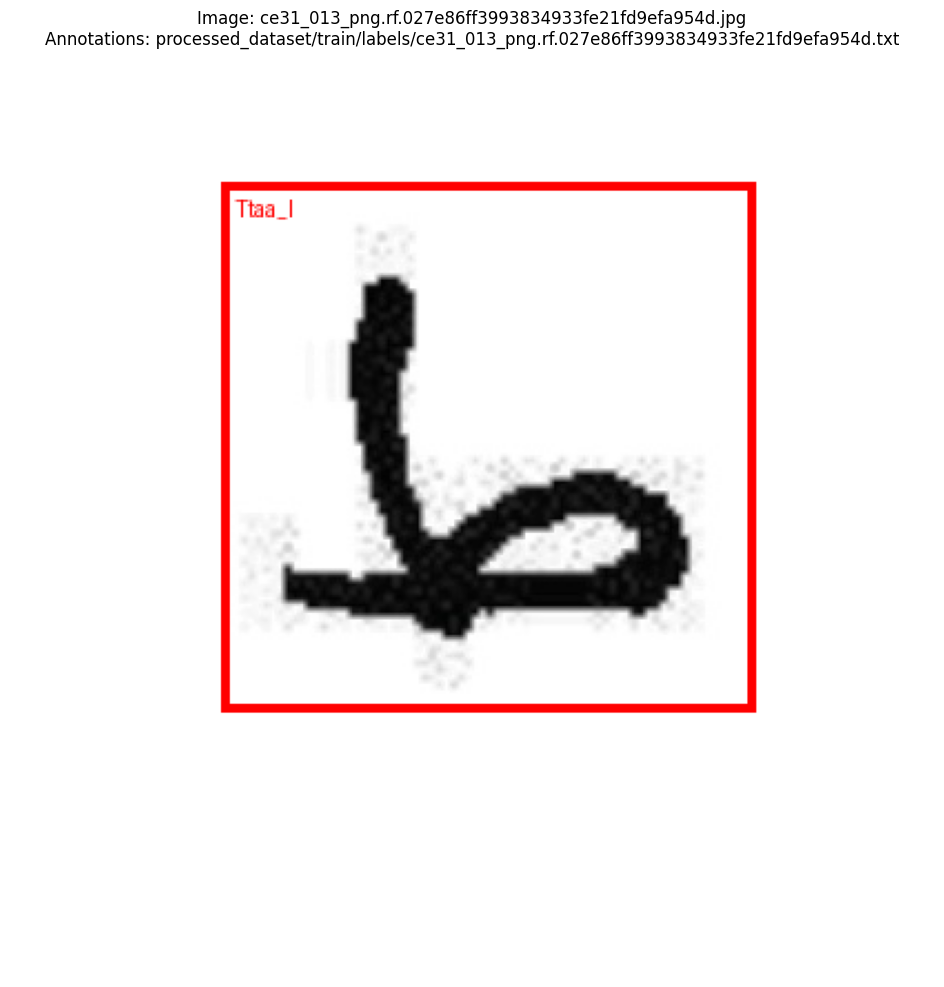

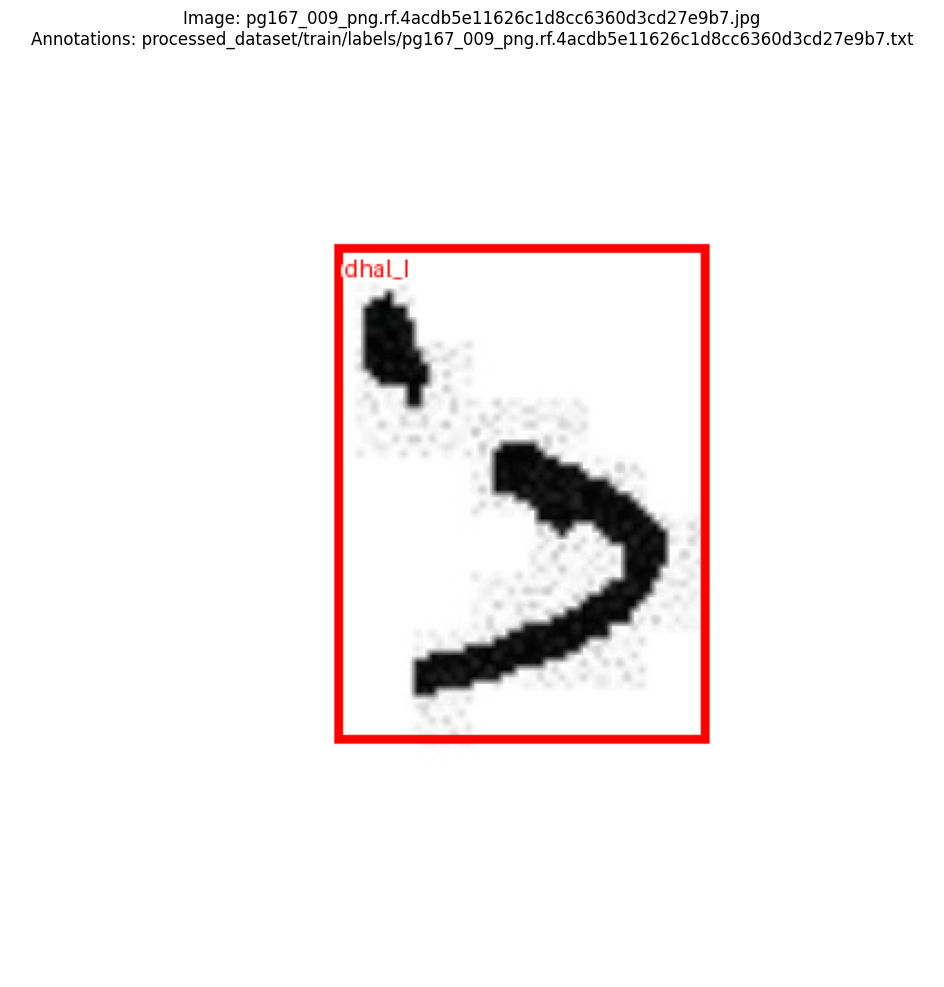

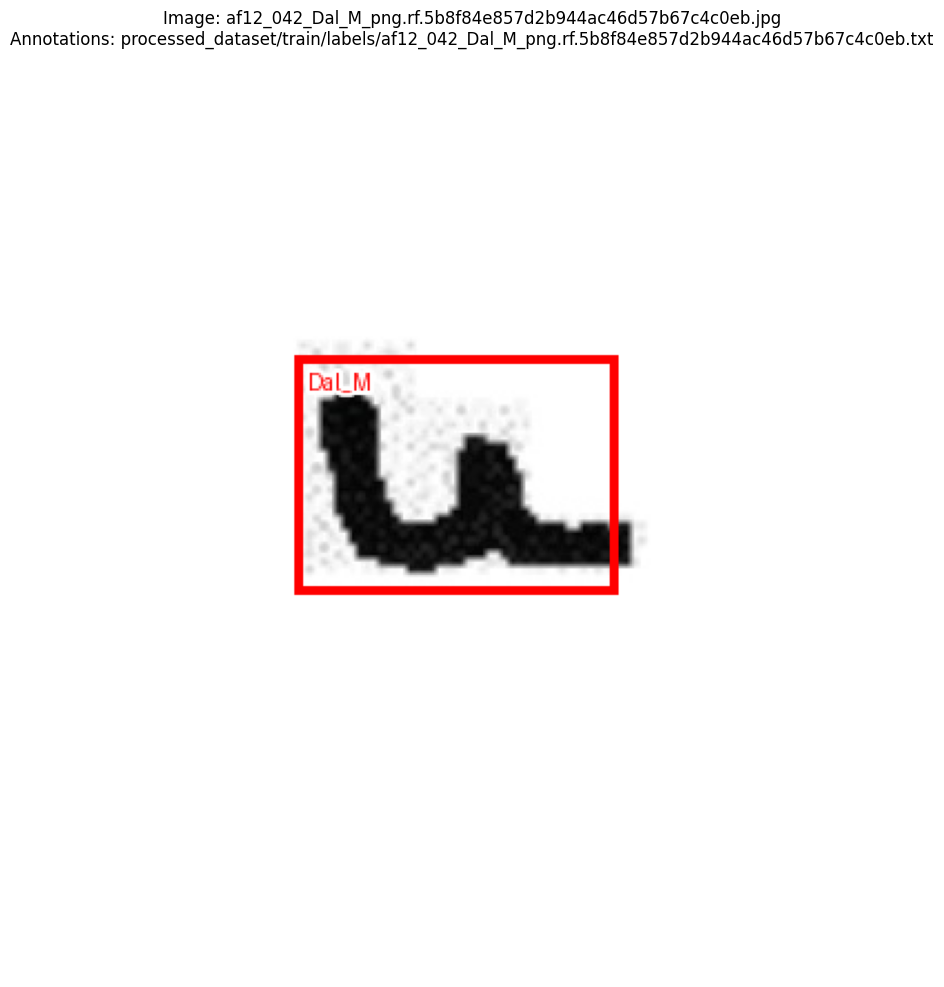

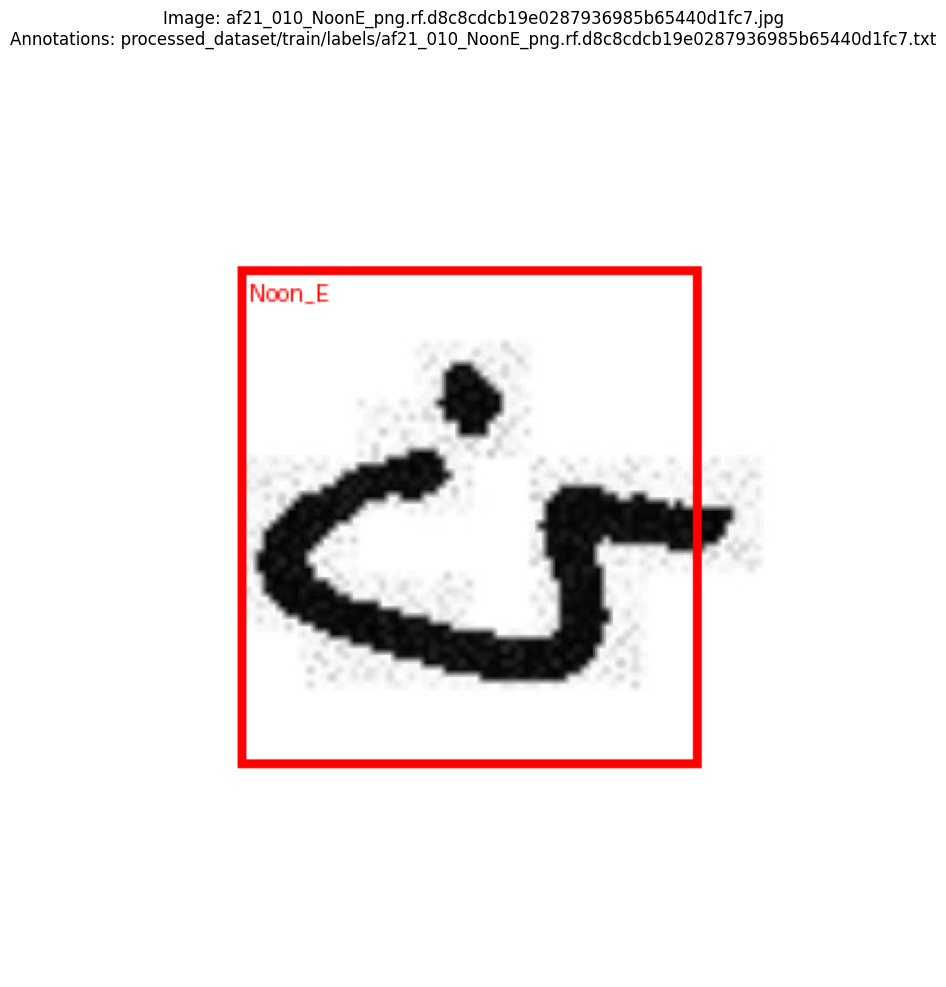

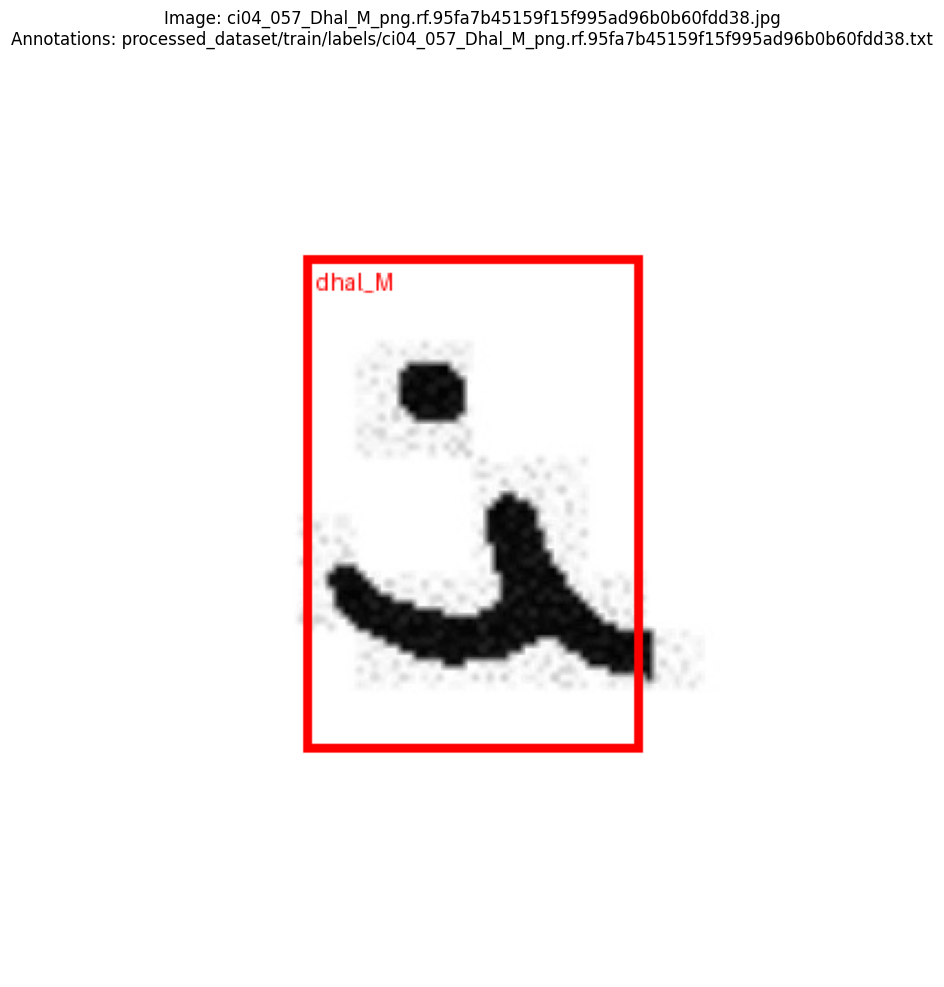

In [ ]:
import os
import random
import yaml
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

# ================ CONFIGURATION ================
DATA_YAML_PATH = "data.yaml"  # Chemin vers votre fichier data.yaml
# ================================================

# Charger les noms de classes depuis data.yaml
with open(DATA_YAML_PATH, 'r') as f:
    data_config = yaml.safe_load(f)
class_names = data_config['names']

# Vérification des chemins
if not os.path.exists("processed_dataset/train/images"):
    raise FileNotFoundError("Dossier 'processed_dataset/train/images' introuvable!")

samples = random.sample(os.listdir("processed_dataset/train/images"), 5)

for img_file in samples:
    img_path = os.path.join("processed_dataset/train/images", img_file)
    lbl_path = img_path.replace("images", "labels").replace(".jpg", ".txt")

    if not os.path.exists(lbl_path):
        print(f"⚠️ Fichier label manquant : {lbl_path}")
        continue

    img = Image.open(img_path)
    draw = ImageDraw.Draw(img)

    try:
        with open(lbl_path, 'r') as f:
            has_annotation = False
            for line in f:
                if not line.strip():
                    continue
                parts = line.strip().split()
                if len(parts) !=5:
                    print(f"Format invalide dans {lbl_path}: {line}")
                    continue

                class_id, xc, yc, w, h = map(float, parts)
                class_id = int(class_id)  # Conversion en entier

                # Récupérer le nom de la classe
                if class_id < len(class_names):
                    class_name = class_names[class_id]
                else:
                    class_name = f"Classe_Inconnue_{class_id}"
                    print(f"⚠️ ID de classe invalide {class_id} dans {lbl_path}")

                # Conversion YOLO → COCO
                x1 = (xc - w/2) * img.width
                y1 = (yc - h/2) * img.height
                x2 = (xc + w/2) * img.width
                y2 = (yc + h/2) * img.height

                # Dessiner la boîte
                draw.rectangle([x1, y1, x2, y2], outline="red", width=4)

                # Ajouter le nom de la classe
                draw.text(
                    (x1 + 5, y1 + 5),  # Position du texte
                    class_name,
                    fill="red",
                    stroke_width=2,
                    stroke_fill="white"
                )
                has_annotation = True

        if has_annotation:
            plt.figure(figsize=(12, 12))
            plt.title(f"Image: {img_file}\nAnnotations: {lbl_path}")
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        else:
            print(f"⚠️ Aucune annotation valide dans {lbl_path}")

    except Exception as e:
        print(f"🚨 Erreur avec {img_file}: {str(e)}")

**5. Configuration finale du modèle**

In [ ]:
from ultralytics import YOLO

# Mise à jour du data.yaml
data_config_updated = {
    'path': '/content/processed_dataset',
    'train': 'train/images',
    'val': 'test/images',
    'names': data_config['names'],
    'nc': data_config['nc'],
    'imgsz': 416
}

with open('data_updated.yaml', 'w') as f:
    yaml.dump(data_config_updated, f)

# Initialisation du modèle
model = YOLO('yolov8m.yaml')


**6. Entraînement avec sauvegarde sur Drive**

In [ ]:
# Configuration d'entraînement
training_params = {
    'data': 'data_updated.yaml',
    'epochs': 65,
    'imgsz': 416,
    'batch': 64,          # Augmenter si GPU le permet
    'device': 'cuda',
    'optimizer': 'AdamW',
    'lr0': 0.0001,       # Augmenté 10x
    'lrf': 0.00001,      # LR final bas
    'cos_lr': True,
    'warmup_epochs': 5,  # Warmup progressif
    'weight_decay': 0.05,
    'patience': 15,
    'project': '/content/drive/MyDrive/Arabic_Word_Detection',
    'name': 'v3_lr_dynamique',
    'amp': True,           # Mixed Precision
}

# Démarrer l'entraînement
try:
    results = model.train(**training_params)
except Exception as e:
    print(f"Erreur : {str(e)}")
    if "CUDA out of memory" in str(e):
        training_params['batch'] = 32
        results = model.train(**training_params)

# Sauvegarde finale
model.save('/content/drive/MyDrive/Arabic_Word_Detection/final_model.pt')
model.export(format='onnx')

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=data_updated.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=65, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=1e-05, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=v3_lr_dynamique, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=15, perspective=0.0, plots=True, pose=12.0, pretrained

100%|██████████| 755k/755k [00:00<00:00, 32.7MB/s]

Overriding model.yaml nc=80 with nc=98

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

  9                  -1  1    831168  ultralytics.nn.modules.block.SPPF            [576, 576, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  2   1993728  ultralytics.nn.modules.block.C2f             [960, 384, 2]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  2    517632  ultralytics.nn.modules.block.C2f             [576, 192, 2]                 
 16                  -1  1    332160  ultralytics.nn.modules.conv.Conv             [192, 192, 3, 2]              
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

100%|██████████| 5.35M/5.35M [00:00<00:00, 133MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 480.0±255.3 MB/s, size: 11.0 KB)


train: Scanning /content/processed_dataset/train/labels... 10808 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10808/10808 [00:05<00:00, 1960.42it/s]


train: New cache created: /content/processed_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 243.2±106.0 MB/s, size: 9.6 KB)


val: Scanning /content/processed_dataset/test/labels... 2745 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2745/2745 [00:02<00:00, 994.52it/s] 


val: New cache created: /content/processed_dataset/test/labels.cache
Plotting labels to /content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.05), 83 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique
Starting training for 65 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/65      10.2G      2.661      5.111      3.188        126        416: 100%|██████████| 169/169 [02:41<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:23<00:00,  1.05s/it]


                   all       2745       3048    0.00281      0.336    0.00767    0.00235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/65      10.1G      1.968      4.018      2.542        134        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:18<00:00,  1.17it/s]

                   all       2745       3048     0.0359     0.0545     0.0244     0.0133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/65      9.99G      1.777      3.534      2.302        135        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.00s/it]


                   all       2745       3048      0.279       0.29      0.163      0.088

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/65      10.4G      1.671      3.201      2.148        129        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.01s/it]


                   all       2745       3048      0.314      0.388      0.259      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/65      10.4G      1.586      2.928      2.039        114        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]


                   all       2745       3048      0.382      0.455      0.368      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/65        10G      1.531      2.743      1.976        118        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]

                   all       2745       3048      0.414      0.523      0.453      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/65        10G      1.481      2.554      1.917        129        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.04s/it]


                   all       2745       3048      0.413      0.501      0.413      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/65      10.4G      1.436      2.404      1.873        137        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.513      0.578      0.585      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/65        10G      1.417      2.298      1.848        115        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:23<00:00,  1.07s/it]


                   all       2745       3048      0.519      0.557      0.576      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/65        10G       1.39      2.199      1.823        127        416: 100%|██████████| 169/169 [02:40<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.02s/it]

                   all       2745       3048      0.666      0.648      0.719      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/65        10G      1.364      2.126      1.798        127        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.01s/it]


                   all       2745       3048      0.679      0.686      0.741       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/65        10G      1.354      2.064       1.79        140        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]

                   all       2745       3048      0.652      0.616      0.681      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/65      9.99G      1.328      2.001      1.762        135        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.01s/it]

                   all       2745       3048      0.724      0.733      0.802      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/65      10.1G      1.315      1.961      1.746        136        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.00it/s]


                   all       2745       3048      0.776      0.715       0.81      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/65        10G        1.3      1.915      1.734        119        416: 100%|██████████| 169/169 [02:39<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]

                   all       2745       3048      0.776      0.759      0.831      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/65        10G      1.286      1.871      1.714        159        416: 100%|██████████| 169/169 [02:38<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.813       0.76      0.849      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/65      10.1G      1.273      1.838      1.705        113        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.01s/it]

                   all       2745       3048      0.776      0.717      0.822      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/65        10G      1.266      1.805      1.702        124        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048      0.805      0.766      0.847      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/65        10G      1.264      1.783      1.698        141        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.819      0.767      0.851      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/65      10.4G      1.246      1.751       1.68        154        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.814      0.793      0.868      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/65        10G      1.238      1.728      1.677        139        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048      0.847      0.782      0.871      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/65        10G      1.233      1.712      1.671        148        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.866      0.796      0.883      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/65      9.99G      1.221      1.651      1.655        112        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.889      0.783      0.889      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/65      9.99G      1.217      1.656      1.658        153        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:20<00:00,  1.05it/s]

                   all       2745       3048      0.865      0.811      0.891       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/65      10.1G      1.206      1.636      1.642        117        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.876      0.815      0.896      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/65        10G      1.203      1.621      1.646        119        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.881      0.822      0.905      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/65        10G      1.201      1.607      1.644        125        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]


                   all       2745       3048      0.886      0.831      0.899      0.621

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/65      9.99G      1.187      1.569      1.627        123        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]

                   all       2745       3048       0.88      0.836      0.903       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/65        10G      1.178      1.562      1.623        125        416: 100%|██████████| 169/169 [02:37<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.899      0.845      0.917      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/65      9.99G      1.163      1.524       1.61        133        416: 100%|██████████| 169/169 [02:37<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]


                   all       2745       3048      0.898      0.848      0.913      0.639

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/65        10G      1.157      1.528       1.61        114        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.911      0.841      0.915      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/65        10G      1.167      1.524      1.615        123        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.00it/s]

                   all       2745       3048      0.908      0.848      0.919      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/65        10G      1.158      1.489      1.602        137        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048      0.896      0.852      0.915      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/65      10.4G      1.151      1.505      1.605        120        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.908      0.854      0.923      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/65      10.1G      1.149      1.469        1.6        139        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.928      0.846      0.927      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/65        10G      1.141      1.441      1.587        122        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.00s/it]


                   all       2745       3048       0.92      0.865      0.929      0.658

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/65        10G      1.136      1.442      1.589        156        416: 100%|██████████| 169/169 [02:40<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.05it/s]

                   all       2745       3048      0.897      0.875      0.928      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/65        10G      1.127      1.435      1.582        144        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.917      0.867      0.928      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/65        10G      1.126      1.409      1.577        147        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.05it/s]

                   all       2745       3048      0.916      0.871       0.93      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/65      10.1G      1.133      1.421      1.583        112        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048       0.91      0.878      0.931      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/65        10G      1.114      1.389       1.57        113        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.00it/s]

                   all       2745       3048      0.918      0.877      0.932      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/65        10G      1.113      1.386       1.57        146        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048       0.92      0.875      0.933      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/65      10.1G       1.11      1.382      1.565        133        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.932      0.872      0.933      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/65      10.4G      1.105      1.367      1.561        127        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.00s/it]

                   all       2745       3048      0.917      0.882      0.935      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/65      10.4G      1.098       1.35      1.553        130        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048      0.916      0.882      0.937      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/65        10G        1.1      1.345      1.557        138        416: 100%|██████████| 169/169 [02:37<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.929      0.878      0.939      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/65      10.4G      1.093      1.334      1.553        150        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.00it/s]

                   all       2745       3048      0.918      0.885      0.939       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/65      10.4G      1.093      1.334       1.55        134        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048      0.928      0.877      0.937      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/65        10G      1.084      1.315      1.543        141        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.03s/it]

                   all       2745       3048      0.917      0.881      0.937      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/65        10G       1.08      1.319      1.545        134        416: 100%|██████████| 169/169 [02:37<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.00s/it]

                   all       2745       3048      0.923      0.886      0.939      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/65      10.4G      1.084      1.318      1.547        146        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]

                   all       2745       3048      0.927      0.884       0.94      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/65      10.4G       1.08      1.296      1.544        128        416: 100%|██████████| 169/169 [02:37<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.927      0.888       0.94      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/65      10.1G      1.077        1.3      1.539        126        416: 100%|██████████| 169/169 [02:37<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.04it/s]


                   all       2745       3048      0.924      0.887       0.94      0.672

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/65        10G       1.07      1.289      1.532        140        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.00it/s]

                   all       2745       3048       0.93      0.883      0.941      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/65        10G      1.074      1.289      1.532        154        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:22<00:00,  1.01s/it]

                   all       2745       3048      0.932      0.885      0.941      0.673


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/65        10G     0.9553     0.6055      1.502         56        416: 100%|██████████| 169/169 [02:38<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]

                   all       2745       3048      0.936      0.878      0.941      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/65        10G     0.9364     0.5502      1.476         75        416: 100%|██████████| 169/169 [02:35<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.937      0.875       0.94      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/65      10.4G     0.9289     0.5433      1.467         62        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.929      0.884      0.941      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/65      10.4G     0.9247     0.5334      1.462         63        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:20<00:00,  1.05it/s]

                   all       2745       3048      0.938      0.877      0.941      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/65      10.1G     0.9243     0.5265      1.462         56        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.03it/s]

                   all       2745       3048      0.937      0.879      0.941      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/65        10G     0.9182     0.5263      1.456         60        416: 100%|██████████| 169/169 [02:35<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]


                   all       2745       3048      0.938      0.879      0.941      0.676

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/65      10.4G     0.9191     0.5235      1.457         74        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.05it/s]

                   all       2745       3048      0.935       0.88      0.942      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/65      9.99G     0.9134     0.5217      1.454         59        416: 100%|██████████| 169/169 [02:37<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.02it/s]

                   all       2745       3048      0.934      0.881      0.942      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/65        10G     0.9148     0.5239      1.453         59        416: 100%|██████████| 169/169 [02:35<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:21<00:00,  1.01it/s]

                   all       2745       3048      0.934      0.881      0.942      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/65        10G     0.9171     0.5241      1.458         56        416: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:20<00:00,  1.05it/s]

                   all       2745       3048      0.934      0.881      0.942      0.677



65 epochs completed in 3.270 hours.
Optimizer stripped from /content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/last.pt, 52.1MB
Optimizer stripped from /content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt, 52.1MB

Validating /content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,896,502 parameters, 0 gradients, 79.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:25<00:00,  1.17s/it]


                   all       2745       3048      0.935       0.88      0.941      0.677
                Alef_E         79         79      0.933      0.875      0.942      0.733
                Alef_I         83         97      0.943      0.849      0.944      0.641
                 Ayn_B         69         69      0.985      0.926       0.98      0.777
                 Ayn_E        101        101      0.972      0.931       0.98      0.818
                 Ayn_I         89         89      0.965      0.989      0.987      0.798
                 Ayn_M         60         60          1      0.904      0.973      0.744
                 Baa_B         54         54      0.984       0.87      0.978      0.699
                 Baa_E         42         42      0.998      0.929      0.957      0.735
                 Baa_I         39         39      0.929          1      0.993       0.81
                 Baa_M         69         69      0.979      0.957      0.988      0.789
                 Dad_

'/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.onnx'

**7. Visualisation des résultats**

AttributeError: 'DataFrame' object has no attribute 'results'

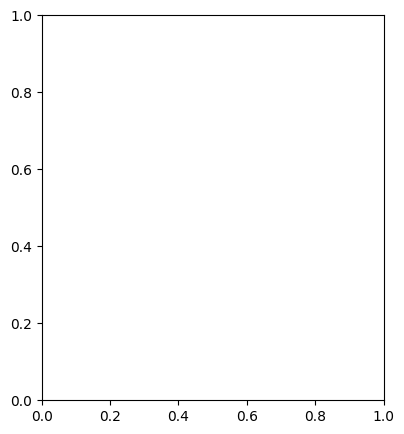

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

results = pd.read_csv('/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/results.csv')

# Plot des métriques
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(results.results['metrics/precision(B)'], label='Précision')
plt.plot(results.results['metrics/recall(B)'], label='Rappel')
plt.title('Précision/Rappel')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(results.results['metrics/mAP50(B)'], label='mAP50')
plt.plot(results.results['metrics/mAP50-95(B)'], label='mAP50-95')
plt.title('mAP')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(results.results['train/box_loss'], label='Train Loss')
plt.plot(results.results['val/box_loss'], label='Val Loss')
plt.title('Loss')
plt.legend()

plt.savefig('/content/drive/MyDrive/Arabic_Word_Detection/training_metrics.png')
plt.show()


image 1/1 /content/ae19_059.bmp: 192x416 2 Alef_Is, 1 Jeem_E, 1 Lam_B, 1 Raa_E, 1 Sheen_B, 1 Sheen_M, 1 Yaa_B, 315.8ms
Speed: 1.5ms preprocess, 315.8ms inference, 1.4ms postprocess per image at shape (1, 3, 192, 416)


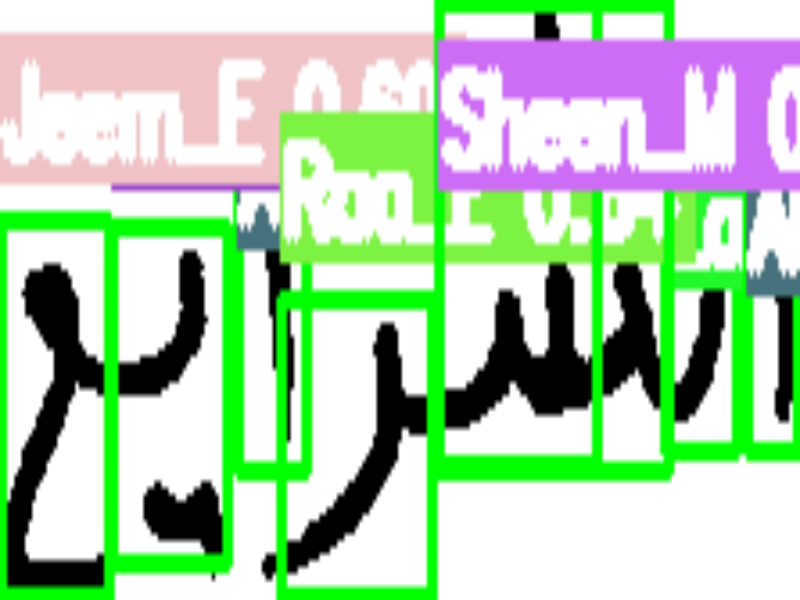

In [ ]:
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import cv2
import random

# Charger le modèle
chemin_model = '/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt'
model = YOLO(chemin_model)

# Prédire sur une image
image = "ae19_059.bmp"
results = model.predict(image)

# Récupérer les noms des classes depuis le modèle
class_names = model.names

# Générer des couleurs distinctes pour chaque classe
random.seed(42)
colors = {i: [random.randint(0, 255) for _ in range(3)] for i in range(len(class_names))}

# Visualiser les résultats
for result in results:
    img = result.orig_img.copy()
    boxes = result.boxes
    for box in boxes:
        class_id = int(box.cls)
        class_name = class_names[class_id]
        conf = box.conf.item()
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())

        # code ajouté
        color = colors[class_id]

        # Dessiner la boîte englobante
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Préparer le texte à afficher
        label = f"{class_name} {conf:.2f}"
        # code ajouté
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.7
        thickness = 2
        text_size, _ = cv2.getTextSize(label, font, font_scale, thickness)
        text_w, text_h = text_size

        # Paramètres du texte
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.6
        thickness = 2
        text_size, _ = cv2.getTextSize(label, font, font_scale, thickness)
        text_w, text_h = text_size

        # Position du texte : à l'intérieur de la boîte si possible
        #text_x = x1 + 5
        #text_y = y1 + text_h + 5  # Ligne de base du texte (pas trop haut)
        # Position du texte
        text_x = x1
        text_y = y1 - 10 if y1 - 10 > 10 else y1 + text_h + 10

        # Fond du texte avec même couleur que la boîte
        cv2.rectangle(img, (text_x, text_y - text_h - 4), (text_x + text_w + 4, text_y + 4), color, -1)

        # Texte en blanc
        cv2.putText(img, label, (text_x + 2, text_y), font, font_scale, (255, 255, 255), thickness)
        # Si la boîte est trop haute (texte dépasserait en bas), on met au-dessus
        #if y2 - y1 < text_h + 10:
        #    text_y = max(y1 - 10, text_h + 5)  # Évite de sortir en haut

        # Dessiner un fond noir pour le texte
        #cv2.rectangle(img, (text_x, text_y - text_h), (text_x + text_w, text_y + 5), (0, 0, 0), -1)

        # Écrire le texte en blanc
        cv2.putText(
            img,
            label,
            (text_x, text_y),
            font,
            font_scale,
            (255, 255, 255),
            thickness
        )

    # Redimensionner l'image pour mieux voir
    img_resized = cv2.resize(img, (800, 600))  # Ajuste selon ta résolution

    # Afficher l'image agrandie
    cv2_imshow(img_resized)


image 1/1 /content/AHTD3A0004_Para1_3_word8.jpg.jpg: 224x416 (no detections), 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 416)


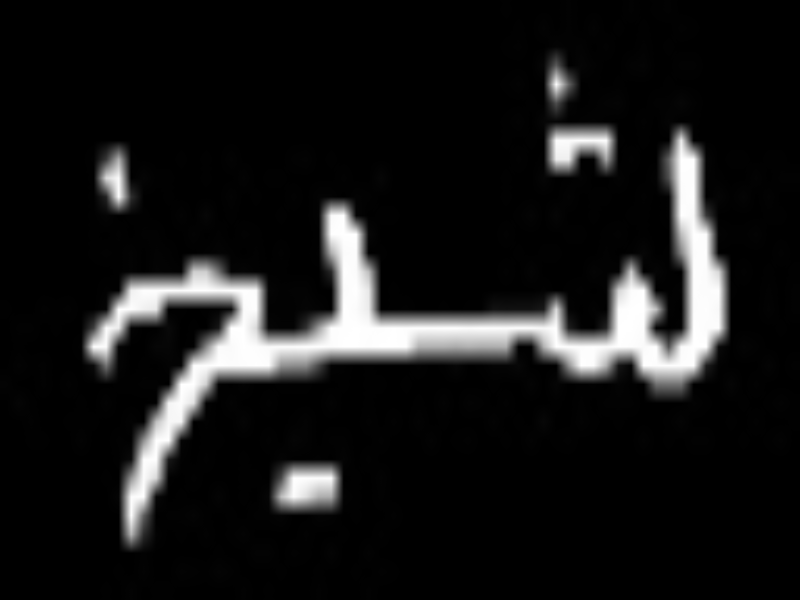

In [ ]:
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import cv2
import random

# Charger le modèle
chemin_model = '/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt'
model = YOLO(chemin_model)

# Prédire sur une image
image = "AHTD3A1086_Para4_3_word12.jpg.jpg"
results = model.predict(image)

# Récupérer les noms des classes depuis le modèle
class_names = model.names


# Générer des couleurs distinctes pour chaque classe
random.seed(42)
colors = {i: [random.randint(0, 255) for _ in range(3)] for i in range(len(class_names))}

# Affichage des résultats
for result in results:
    img = result.orig_img.copy()
    boxes = result.boxes
    for box in boxes:
        class_id = int(box.cls)
        class_name = class_names[class_id]
        conf = box.conf.item()
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())

        # Couleur pour cette classe
        color = colors[class_id]

        # Dessiner la boîte englobante
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

        # Texte de l'étiquette
        # label = f"{class_name} {conf:.2f}"
        label = class_name

        # Style du texte
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        text_size, _ = cv2.getTextSize(label, font, font_scale, thickness)
        text_w, text_h = text_size

        # Position du texte
        text_x = x1
        text_y = y1 - 10 if y1 - 10 > 10 else y1 + text_h + 10

        # Fond de texte coloré
        cv2.rectangle(img, (text_x, text_y - text_h - 4), (text_x + text_w + 4, text_y + 4), color, -1)

        # Texte en blanc
        cv2.putText(img, label, (text_x + 2, text_y), font, font_scale, (255, 255, 255), thickness)

    # Redimensionner l'image pour affichage
    img_resized = cv2.resize(img, (800, 600))
    cv2_imshow(img_resized)

In [ ]:
cv2.imwrite("/content/image_resultat.png", img_resized)
from google.colab import files
files.download("/content/image_resultat.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


image 1/1 /content/processed_dataset/test/images/ai46_060_bmp.rf.588a007161b5975f868204c6a351f011.jpg: 416x416 1 Alef_E, 1 Kha_I, 1 Sheen_M, 1 meem_M, 22.5ms
Speed: 1.1ms preprocess, 22.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 416)
Results saved to /content/resultats_mot/pred9


error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


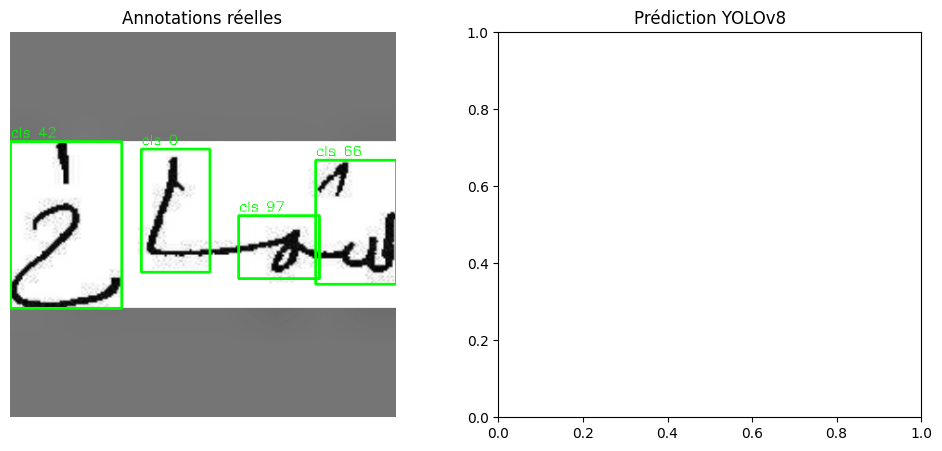

In [ ]:
# Installer Ultralytics (si pas encore fait)
!pip install ultralytics --quiet

# Importer les bibliothèques
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# 🔧 === CONFIGURATION ICI === 🔧

# Chemin vers l'image de test (mot manuscrit)
image_path = '/content/processed_dataset/test/images/ai46_060_bmp.rf.588a007161b5975f868204c6a351f011.jpg'  # 🔁 À MODIFIER

# Chemin vers le fichier d’annotation (YOLO .txt)
label_path = image_path.replace('/images/', '/labels/').replace('.jpg', '.txt')

# Chemin vers le modèle YOLOv8 entraîné
model_path = '/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt'  # 🔁 À MODIFIER

# 📁 Créer un dossier pour sauvegarder les résultats
os.makedirs('/content/resultats_mot', exist_ok=True)

# 🔹 1. Afficher l’image avec les annotations réelles
image = cv2.imread(image_path)
image_ann = image.copy()
h, w, _ = image.shape

with open(label_path, 'r') as f:
    for line in f:
        cls, x, y, bw, bh = map(float, line.strip().split())
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)
        cv2.rectangle(image_ann, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image_ann, f'cls {int(cls)}', (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1)

cv2.imwrite('/content/resultats_mot/image_labels_mot.jpg', image_ann)

# 🔹 2. Prédiction avec YOLOv8
model = YOLO(model_path)
results = model(image_path, save=True, save_txt=False, project='/content/resultats_mot', name='pred')

# 🔹 3. Afficher les deux images
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.title('Annotations réelles')
plt.imshow(cv2.cvtColor(image_ann, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Prédiction YOLOv8')
pred_image_path = os.path.join('/content/resultats_mot/pred', os.path.basename(image_path))
pred_img = cv2.imread(pred_image_path)
plt.imshow(cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


Nombre d'images trouvées : 249


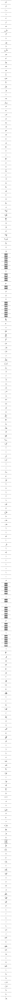

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from glob import glob

# 🔧 À modifier : dossier contenant les images
image_dir = '/content/processed_dataset/test/images'  # 🔁

# 🔍 Trouver toutes les images dont le nom commence par 'ai'
image_paths = sorted(glob(os.path.join(image_dir, 'ai*.jpg')))

# Afficher le nombre trouvé
print(f"Nombre d'images trouvées : {len(image_paths)}")

# Affichage des images (6 par ligne)
plt.figure(figsize=(15, len(image_paths) * 2))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(len(image_paths), 1, i + 1)
    plt.imshow(img_rgb)
    plt.title(os.path.basename(img_path))
    plt.axis('off')

plt.tight_layout()
plt.show()


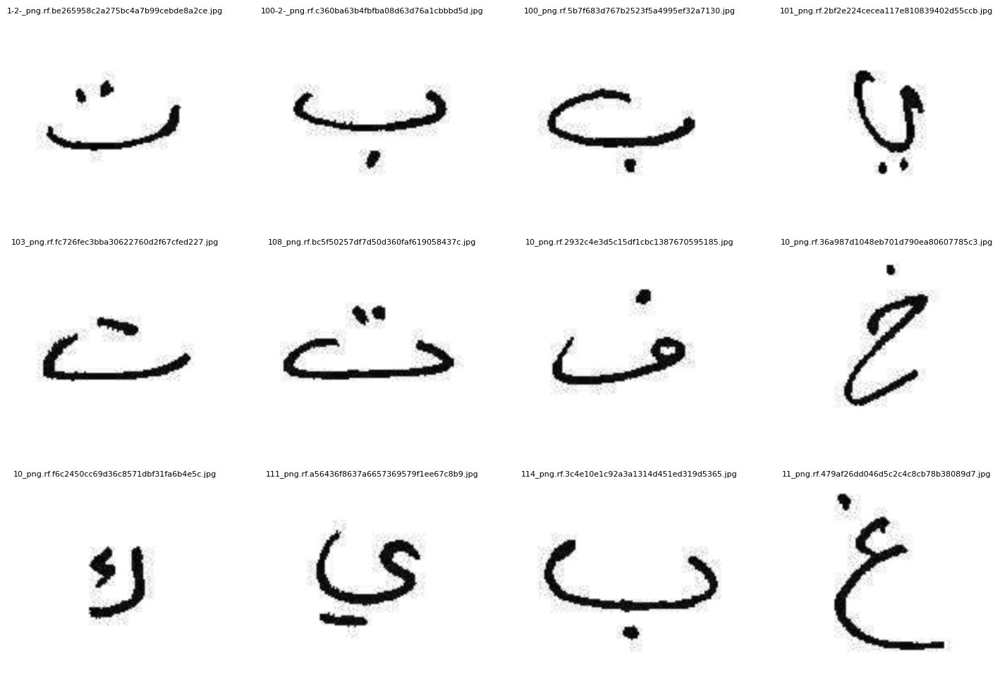

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
from glob import glob

# Paramètres
image_dir = '/content/processed_dataset/test/images'
image_paths = sorted(glob(os.path.join(image_dir, '*.jpg')))
num_images = min(12, len(image_paths))  # Choisir combien d’images afficher

# Grille
plt.figure(figsize=(15, 10))
for i in range(num_images):
    img = cv2.imread(image_paths[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3, 4, i+1)  # 3 lignes x 4 colonnes
    plt.imshow(img)
    plt.title(os.path.basename(image_paths[i]), fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
from glob import glob

# 📁 Dossier contenant les images
image_dir = '/content/processed_dataset/test/images'  # 🔁 Modifie si nécessaire

# 🔍 Trouver toutes les images (tu peux adapter l’extension ici)
image_paths = sorted(glob(os.path.join(image_dir, '*.jpg')))

# 📋 Afficher tous les noms d’image
print("📄 Liste des images trouvées :\n")
for path in image_paths:
    print(os.path.basename(path))

# 🔢 Dimensions de la grille
cols = 4
rows = (len(image_paths) + cols - 1) // cols

# 🖼️ Affichage de toutes les images
plt.figure(figsize=(4 * cols, 3 * rows))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(os.path.basename(img_path), fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


📄 Liste des images trouvées :

1-2-_png.rf.be265958c2a275bc4a7b99cebde8a2ce.jpg
100-2-_png.rf.c360ba63b4fbfba08d63d76a1cbbbd5d.jpg
100_png.rf.5b7f683d767b2523f5a4995ef32a7130.jpg
101_png.rf.2bf2e224cecea117e810839402d55ccb.jpg
103_png.rf.fc726fec3bba30622760d2f67cfed227.jpg
108_png.rf.bc5f50257df7d50d360faf619058437c.jpg
10_png.rf.2932c4e3d5c15df1cbc1387670595185.jpg
10_png.rf.36a987d1048eb701d790ea80607785c3.jpg
10_png.rf.f6c2450cc69d36c8571dbf31fa6b4e5c.jpg
111_png.rf.a56436f8637a6657369579f1ee67c8b9.jpg
114_png.rf.3c4e10e1c92a3a1314d451ed319d5365.jpg
11_png.rf.479af26dd046d5c2c4c8cb78b38089d7.jpg
129_png.rf.afabcd5d6448aa80410548fba18437b9.jpg
12_png.rf.8acdcc0108a01ed8c2b34ae530d352e3.jpg
12_png.rf.95ce4eaf810aade82f55ee2ce6008de8.jpg
131_png.rf.c8dda6f9a7d741c505d7abe6da2cac6c.jpg
13_png.rf.328057e3d9c4c66cc73d8e95fcc244e5.jpg
13_png.rf.70abb3a45d67387234289d458a4c37c0.jpg
13_png.rf.9f617fd106d72b189c202e05319b699e.jpg
14_png.rf.509d3d94135eaf0d0cfab51169f93956.jpg
14_png.rf.67a55

KeyboardInterrupt: 

# Test des images de portable

Veuillez uploader votre image (formats supportés : BMP, JPEG, PNG, etc.)


Saving 20250613_183606.jpg to 20250613_183606 (2).jpg

image 1/1 /content/temp_image.jpg: 416x416 (no detections), 22.8ms
Speed: 1.3ms preprocess, 22.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)
Résultats de la détection :


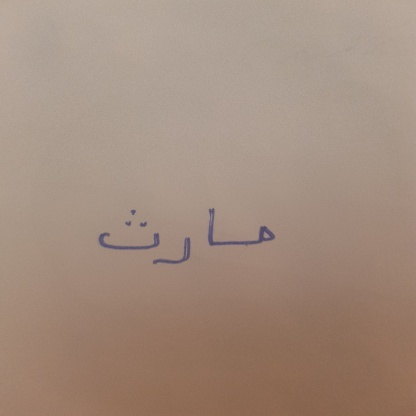


Boxes : ultralytics.engine.results.Boxes object with attributes:

cls: tensor([], device='cuda:0')
conf: tensor([], device='cuda:0')
data: tensor([], device='cuda:0', size=(0, 6))
id: None
is_track: False
orig_shape: (416, 416)
shape: torch.Size([0, 6])
xywh: tensor([], device='cuda:0', size=(0, 4))
xywhn: tensor([], device='cuda:0', size=(0, 4))
xyxy: tensor([], device='cuda:0', size=(0, 4))
xyxyn: tensor([], device='cuda:0', size=(0, 4))
Confiance : tensor([], device='cuda:0')
Classes : tensor([], device='cuda:0')


In [ ]:
# Nouvelle cellule pour prédiction sur image personnalisée
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from ultralytics import YOLO

# 1. Importation de l'image (via upload)
from google.colab import files

#print("Veuillez uploader votre image (formats supportés : BMP, JPEG, PNG, etc.)")
#uploaded = files.upload()
#image_path = list(uploaded.keys())[0]
image_path()
# 2. Chargement de l'image
image = cv2.imread(image_path)

# 3. Prétraitement (adapté à votre dataset d'entraînement)
# Redimensionnement à 416x416
image_resized = cv2.resize(image, (416, 416))

# Normalisation (si utilisé pendant l'entraînement)
image_normalized = image_resized / 255.0

# Sauvegarde temporaire au format JPG
temp_path = "temp_image.jpg"
cv2.imwrite(temp_path, (image_normalized * 255).astype(np.uint8))

# 4. Chargement du modèle et prédiction
model_path = '/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt'
model = YOLO(model_path)
results = model(temp_path)

# 5. Affichage des résultats
print("Résultats de la détection :")
for result in results:
    # Affichage de l'image avec les boîtes de détection
    annotated_image = result.plot()
    cv2_imshow(annotated_image)  # Correction ici : "annoted" → "annotated"

    # Affichage des détails de prédiction
    print(f"\nBoxes : {result.boxes}")
    print(f"Confiance : {result.boxes.conf}")
    print(f"Classes : {result.boxes.cls}")

In [ ]:
#

In [ ]:
#

In [ ]:
#

In [ ]:
# Cellule 1 : Upload de l'image (Colab)
from google.colab import files
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Télécharger l'image
uploaded = files.upload()
image_path = next(iter(uploaded.keys()))  # Récupère le nom du fichier uploadé

# Charger l'image avec OpenCV
image = cv2.imread(image_path)
print("Image uploadée et chargée !")

Saving 20250613_183606.jpg to 20250613_183606 (3).jpg
Image uploadée et chargée !


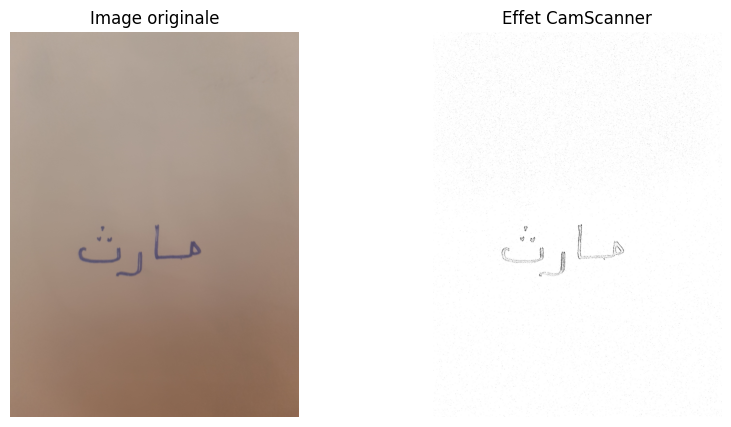

In [ ]:
# Cellule 2 : Traitement de l'image (effet CamScanner)
def camscanner_effect(image):
    # Conversion en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Flou gaussien pour réduire le bruit
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Seuillage adaptatif pour améliorer le contraste
    thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 11, 2)

    # Détection des contours (optionnel)
    edges = cv2.Canny(thresh, 75, 200)

    return thresh, edges

# Appliquer le traitement
processed_image, edges = camscanner_effect(image)

# Afficher les résultats
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Image originale")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Effet CamScanner")
plt.imshow(processed_image, cmap='gray')
plt.axis('off')
plt.show()

Veuillez uploader votre image (formats supportés : BMP, JPEG, PNG)


Saving 20250613_183606.jpg to 20250613_183606 (4).jpg

image 1/1 /content/temp_processed.jpg: 416x416 1 Waw_E, 1 Waw_I, 22.5ms
Speed: 1.0ms preprocess, 22.5ms inference, 236.4ms postprocess per image at shape (1, 3, 416, 416)

Détails de la prédiction :
Boxes : ultralytics.engine.results.Boxes object with attributes:

cls: tensor([82., 81.], device='cuda:0')
conf: tensor([0.7724, 0.7526], device='cuda:0')
data: tensor([[174.7823, 234.5387, 195.4215, 265.0979,   0.7724,  82.0000],
        [175.1258, 233.6982, 196.7771, 266.8746,   0.7526,  81.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (416, 416)
shape: torch.Size([2, 6])
xywh: tensor([[185.1019, 249.8183,  20.6392,  30.5592],
        [185.9515, 250.2864,  21.6513,  33.1764]], device='cuda:0')
xywhn: tensor([[0.4450, 0.6005, 0.0496, 0.0735],
        [0.4470, 0.6017, 0.0520, 0.0798]], device='cuda:0')
xyxy: tensor([[174.7823, 234.5387, 195.4215, 265.0979],
        [175.1258, 233.6982, 196.7771, 266.8746]], device='cuda:

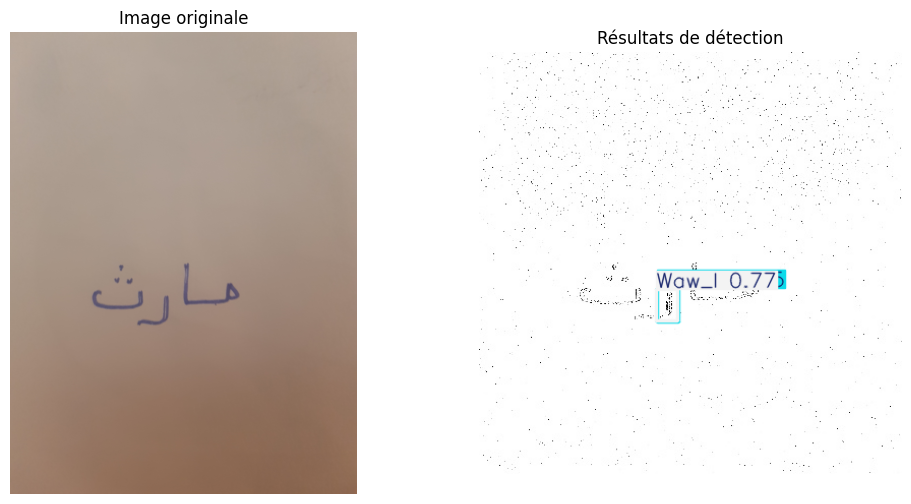

In [ ]:
# Cellule 3 : Test du modèle sur image scannée
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from ultralytics import YOLO

# 1. Upload de l'image
print("Veuillez uploader votre image (formats supportés : BMP, JPEG, PNG)")
uploaded = files.upload()
image_path = next(iter(uploaded.keys()))
original_image = cv2.imread(image_path)

# 2. Fonction de prétraitement (effet CamScanner)
def camscanner_effect(image):
    # Conversion en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Flou gaussien pour réduire le bruit
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Seuillage adaptatif pour améliorer le contraste
    thresh = cv2.adaptiveThreshold(blurred, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 11, 2)
    return thresh

# Appliquer le prétraitement
processed_image = camscanner_effect(original_image)

# Redimensionnement à 416x416 (taille d'entrée du modèle)
resized_image = cv2.resize(processed_image, (416, 416))

# Sauvegarde temporaire au format JPG
temp_path = "temp_processed.jpg"
cv2.imwrite(temp_path, resized_image)

# 3. Charger le modèle et faire la prédiction
model_path = '/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt'
try:
    model = YOLO(model_path)
    results = model(temp_path)

    # 4. Afficher les résultats
    plt.figure(figsize=(12, 6))

    # Image originale
    plt.subplot(1, 2, 1)
    plt.title("Image originale")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Image traitée avec détections
    plt.subplot(1, 2, 2)
    plt.title("Résultats de détection")
    for result in results:
        annotated_image = result.plot()
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        # Détails de prédiction
        print("\nDétails de la prédiction :")
        print(f"Boxes : {result.boxes}")
        print(f"Confiance : {result.boxes.conf}")
        print(f"Classes : {result.boxes.cls}")

    plt.show()

except Exception as e:
    print(f"Erreur lors de la prédiction : {str(e)}")
    if "Cannot find best.pt" in str(e):
        print("⚠️ Vérifiez le chemin vers votre modèle YOLO")

In [ ]:
from PIL import Image, ImageEnhance
import cv2
import numpy as np

# Ouvrir l'image
image = Image.open("20250613_183606.jpg")

# Augmenter la densité du texte
enhancer = ImageEnhance.Contrast(image)
image = enhancer.enhance(2.0)

# Convertir en niveaux de gris
image_gray = image.convert('L')

# Appliquer un seuil binaire inversé
threshold = 128
image_processed = image_gray.point(lambda p: 255 if p < threshold else 0)

# Enregistrer l'image traitée
image_processed.save("image_traitee.png")

# Vérification visuelle
image_processed.show()

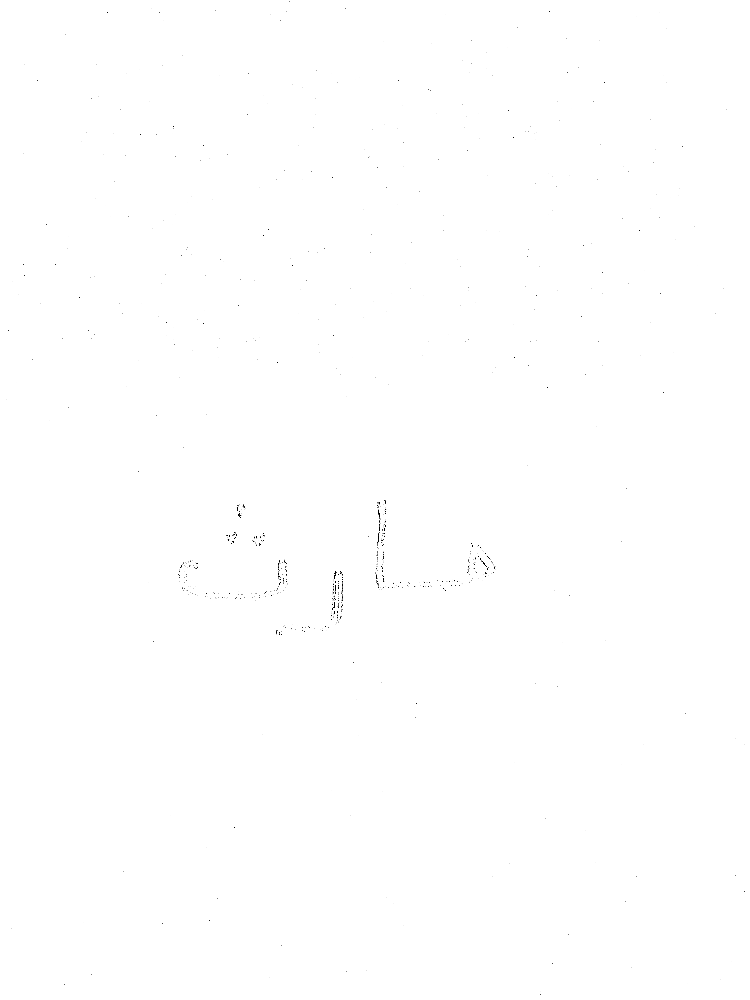

In [ ]:
# Cellule améliorée pour un résultat net avec texte plus foncé
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

def advanced_image_processing(image_path):
    # Charger l'image
    image = cv2.imread(image_path)

    # Conversion en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Flou gaussien pour réduire le bruit
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Seuillage adaptatif avec inversion si nécessaire
    thresh = cv2.adaptiveThreshold(blurred, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV,  # Essai de l'inversion
                                   11, 2)

    # Inversion manuelle au cas où
    inverted = cv2.bitwise_not(thresh)

    # Épaississement du texte (optionnel)
    kernel = np.ones((2,2),np.uint8)
    dilated = cv2.dilate(inverted, kernel, iterations=1)

    return dilated

# Exécution
processed_image = advanced_image_processing("20250613_183606.jpg")
cv2_imshow(processed_image)

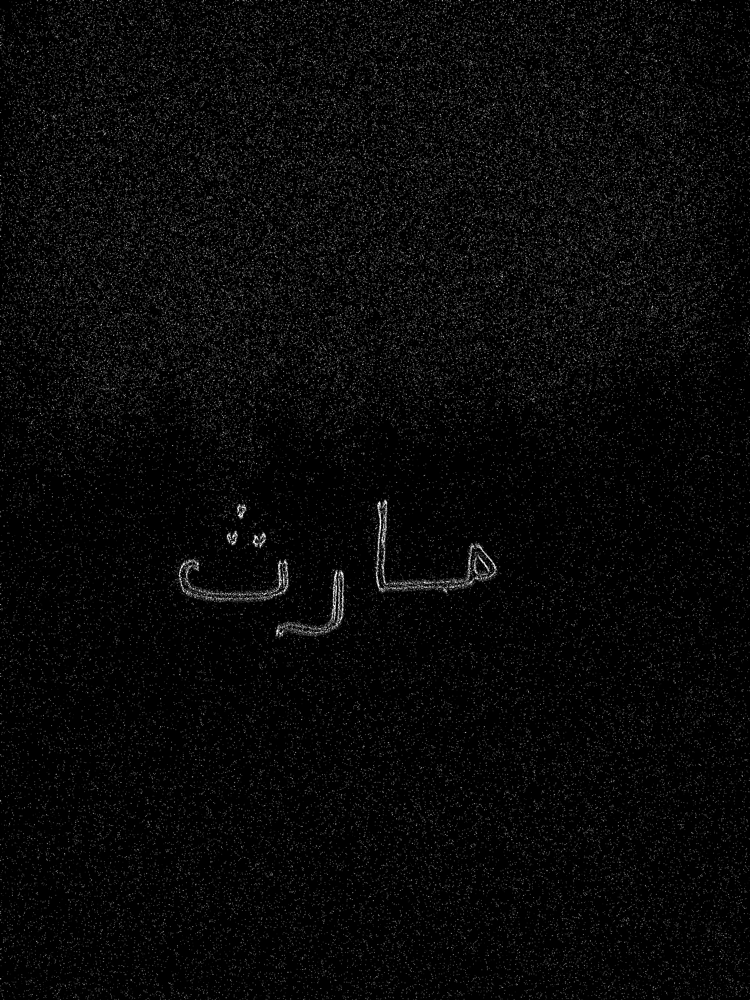

In [ ]:
from google.colab.patches import cv2_imshow
img = cv2.imread('20250613_183606.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2))
opened = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel)
closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)

thresh = cv2.adaptiveThreshold(closed, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                             cv2.THRESH_BINARY_INV, 11, 2)

kernel = np.ones((2,2), np.uint8)
dilated = cv2.dilate(thresh, kernel, iterations=1)
eroded = cv2.erode(dilated, kernel, iterations=1)

cv2_imshow(eroded)


In [ ]:
!pip install pytesseract

In [ ]:
from ultralytics import YOLO
import cv2
import pytesseract

# Charger le modèle YOLO entraîné pour le texte arabe
model = YOLO('/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt')  # Modèle entraîné sur des données arabe

# Prétraitement de l'image
image = cv2.imread('20250613_183606.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# Détection avec YOLO
results = model.predict(thresh)

# Extraction du texte avec Tesseract
text = pytesseract.image_to_string(thresh, lang='ara')
print("Texte détecté :", text)

RuntimeError: Given groups=1, weight of size [48, 3, 3, 3], expected input[1, 1, 416, 320] to have 3 channels, but got 1 channels instead

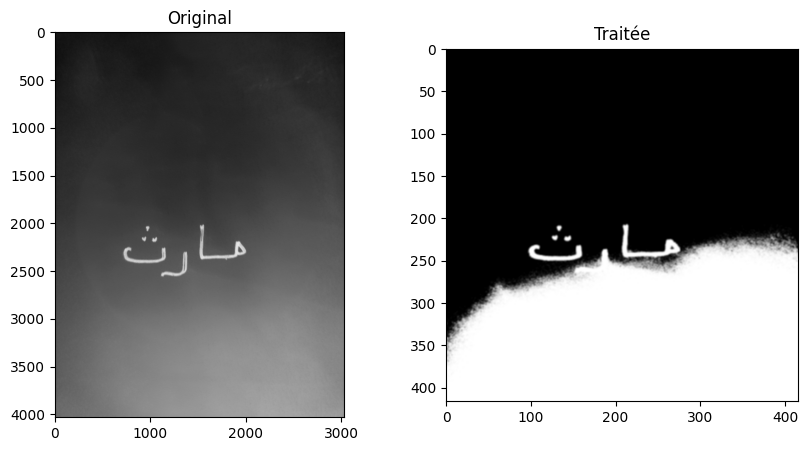

Image traitée sauvegardée : 20250613_183606.jpg


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(input_path, output_size=(416, 416)):
    # Charger l'image en niveaux de gris
    img = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)

    # 1. Inversion de l'image si le texte est clair sur fond foncé
    if np.mean(img) > 128:  # Si l'image est majoritairement claire
        img = cv2.bitwise_not(img)  # Inverser pour avoir texte noir sur fond blanc

    # 2. Seuillage adaptatif pour améliorer le contraste
    _, binary = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # 3. Suppression du bruit (points isolés)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    # 4. Redimensionner tout en conservant les proportions
    resized = cv2.resize(cleaned, output_size, interpolation=cv2.INTER_AREA)

    # 5. Appliquer un flou gaussien léger pour lisser
    smoothed = cv2.GaussianBlur(resized, (3, 3), 0)

    # 6. Normalisation finale
    final = cv2.normalize(smoothed, None, 0, 255, cv2.NORM_MINMAX)

    # Affichage
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.title('Original')
    plt.imshow(img, cmap='gray')

    plt.subplot(122)
    plt.title('Traitée')
    plt.imshow(final, cmap='gray')
    plt.show()

    # Sauvegarde
    output_path = input_path.replace('.bmp', '_processed.bmp')
    cv2.imwrite(output_path, final)
    print(f"Image traitée sauvegardée : {output_path}")

    return final

# Exemple d'utilisation
input_image = '20250613_183606.jpg'
processed_img = preprocess_image(input_image)


image 1/1 /content/20250613_183606.jpg: 416x416 (no detections), 24.9ms
Speed: 1.3ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


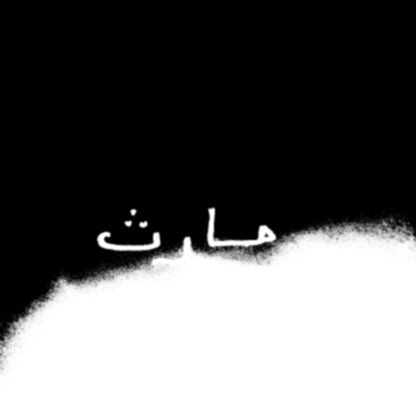

In [ ]:
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import cv2
import random

# Charger le modèle
chemin_model = '/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt'
model = YOLO(chemin_model)

# Prédire sur une image
image = "20250613_183606.jpg"
results = model.predict(image)

# Récupérer les noms des classes depuis le modèle
class_names = model.names

# Générer des couleurs distinctes pour chaque classe
random.seed(42)

# Afficher les résultats
for r in results:
    # Obtenir l'image avec les détections
    annotated_img = r.plot()

    # Convertir l'image de BGR à RGB (pour affichage correct)
    annotated_img_rgb = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    # Afficher l'image annotée
    cv2_imshow(annotated_img_rgb)

In [ ]:
from ultralytics import YOLO
import cv2
import os

# Chemin de l'image d'entrée
image_path = "20250613_183606.jpg"

# Charger le modèle YOLOv8
model = YOLO("/content/drive/MyDrive/Arabic_Word_Detection/v3_lr_dynamique/weights/best.pt")

# Étape de prétraitement : Conversion en noir et blanc
image = cv2.imread(image_path)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Conversion en format 3 canaux pour être compatible avec YOLOv8
gray_3channels = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR)

# Prédiction avec YOLOv8
results = model(gray_3channels)

# Récupérer les résultats
result = results[0]
boxes = result.boxes.xyxy.cpu().numpy()  # Coordonnées des boîtes
classes = result.boxes.cls.cpu().numpy().astype(int)  # Classes prédites

# Dessiner les boîtes sur l'image originale (en noir et blanc)
for box, cls in zip(boxes, classes):
    x1, y1, x2, y2 = map(int, box)
    cv2.rectangle(gray_3channels, (x1, y1), (x2, y2), (255, 0, 0), 2)  # En bleu

# Enregistrer l'image résultante
output_path = "im_tr_nb.jpg"
cv2.imwrite(output_path, gray_3channels)

print(f"Image traitée enregistrée à {output_path}")


0: 416x416 (no detections), 22.5ms
Speed: 1.2ms preprocess, 22.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 416)
Image traitée enregistrée à im_tr_nb.jpg
